In [1]:
import matplotlib
import matplotlib.pyplot as plt
import math
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.nn.utils.rnn import pad_sequence
from torch.utils.data import DataLoader
from grid_fusion_pytorch.dataset import PointCloudDataset, CustomCollate
from apex import amp
import time
import sys
import os
import shutil
from tqdm.auto import tqdm
from pprint import pprint

import torch_scatter
from grid_fusion_pytorch.render import render_grids, batch_fuse_to_grid
from grid_fusion_pytorch.model import RefineModel
from moviepy import editor as mpy


import sys

import warnings 
warnings.filterwarnings("ignore", category=UserWarning)  

/usr/local/lib/python3.8/dist-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
cmap_17 = torch.tensor([[161.,203,242],   #  0 - cracker_box
                        [227,88,34],      #  1 - sugar_box
                        [247,167,0],      #  2 - mustard_bottle
                        [100,68,34],      #  3 - potted_meat_can
                        [243,195,0],      #  4 - banana
                        [137,44,22],      #  5 - bleach_cleanser
                        [219,210,0],      #  6 - mug
                        [179,68,108],     #  7 - sponge
                        [41,183,0],       #  8 - spatula
                        [96,78,151],      #  9 - power_drill
                        [249,147,120],    # 10 - wood_block
                        [0,103,166],      # 11 - extra_large_clamp
                        [230,143,172],    # 12 - softball
                        [0,136,85],       # 13 - golf_ball
                        [132,132,130],    # 14 - dice
                        [195,179,129],    # 15 - toy_airplane
                        [191,0,50]])/255. # 16 - red_box

labels = ['cracker_box', 'sugar_box', 'mustard_bottle', 'potted_meat_can', 'banana', 'bleach_cleanser', 'mug', 'sponge', 'spatula', 'power_drill', 'wood_block', 'extra_large_clamp', 'softball', 'golf_ball', 'dice', 'toy_airplane', 'red_box']

#remap = torch.tensor([0, 1, 2, 3, 7, 8, 13, 14, 16, -1])
#subsample = torch.tensor([0, 1, 2, 3, 7, 8, 13, 14, 16]).long()
#cmap_17 = cmap_17[subsample]
print(cmap_17.shape)

torch.Size([17, 3])


In [3]:
cmap_39 = torch.tensor([[188,143,143],    # master_chef_can -  0
                        [161,203,242],    # cracker_box -  1
                        [227,88,34],      # sugar_box -  2
                        [240,128,128],    # tomato_soup_can -  3
                        [247,167,0],      # mustard_bottle -  4
                        [0,191,255],      # tuna_fish_can -  5
                        [102,205,170],    # pudding_box -  6
                        [255,69,0],       # gelatin_box -  7
                        [100,68,34],      # potted_meat_can -  8
                        [243,195,0],      # banana -  9
                        [252,90,141],     # strawberry - 10
                        [154,191,89],     # apple - 11
                        [252,227,190],    # peach - 12
                        [81,59,75],       # plum - 13
                        [100,149,237],    # pitcher_base - 14
                        [137,44,22],      # bleach_cleanser - 15
                        [0,100,0],        # bowl - 16
                        [219,210,0],      # mug - 17
                        [179,68,108],     # sponge - 18
                        [41,183,0],       # spatula - 19
                        [96,78,151],      # power_drill - 20
                        [249,147,120],    # wood_block - 21
                        [205,133,63],     # scissors - 22
                        [0,255,0],        # large_marker - 23
                        [255,0,0],        # adjustable_wrench - 24
                        [255,165,0],      # flat_screwdriver - 25
                        [199,21,133],     # hammer - 26
                        [0,250,154],      # medium_clamp - 27
                        [0,103,166],      # extra_large_clamp - 28
                        [230,143,172],    # softball - 29
                        [223,255,79],     # tennis_ball - 30
                        [139,0,139],      # racquetball - 31
                        [0,136,85],       # golf_ball - 32
                        [0,0,255],        # foam_brick - 33
                        [132,132,130],    # dice - 34
                        [240,128,128],    # colored_wood_blocks - 35
                        [195,179,129],    # toy_airplane - 36
                        [0,255,255],      # rubiks_cube - 37
                        [191,0,50]])/255. # red_box - 38

In [4]:
MODE = 'normal'
DATASET_NAME = 'overfit_O39_S1_C32_pcd_' + MODE #'proto_refine_pcd'
NUM_CAMS = -1
BATCH_SIZE = 1
INSPECT_SHAPES = True
RANDOM_PCD = False

# create a dummy dataset and showcase dataloading
test_dataset = PointCloudDataset(root='/home/nfs/inf6/data/datasets/semantic_pcd_data/'+DATASET_NAME, split='full',
                                 num_steps=-1, num_cams=NUM_CAMS, random_pcd=RANDOM_PCD, cam_world=False)
if INSPECT_SHAPES:
    print('Length of test_dataset:', len(test_dataset), '\n')

# look at the data returned by this dataset
if INSPECT_SHAPES:
    test_output = test_dataset.__getitem__(0)
    pcd, semseg, cam_pose, depth, cam_k, gt = test_output
    print('Dataset __getitem__ output len/shapes:\n', len(pcd), semseg.shape, cam_pose.shape, depth.shape, cam_k.shape, gt.shape, '\n')
    print('pcd element shapes:')
    for item in pcd:
        print(item.shape)
    print()

# define a collate function and a dataloader
collate = CustomCollate(min_num_steps=1, max_num_steps=2)
test_dataloader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, collate_fn=collate)
# look at the output shapes of each minibatch
if INSPECT_SHAPES:
    for pcd, semseg, cam_pose, depth, cam_k, gt in test_dataloader:
        print('Minibatch output len/shapes:\n', len(pcd), semseg.shape, cam_pose.shape, depth.shape, cam_k.shape, gt.shape)
        print('pcd batched element shapes:')
        for item in pcd:
            print(item.shape)
    print()

# example for adapting the maximum number of fusion/refinement steps
if INSPECT_SHAPES:
    test_dataloader.collate_fn.set_steps(1, 6)
    for pcd, semseg, cam_pose, depth, cam_k, gt in test_dataloader:
        print('Minibatch output len/shapes:\n', len(pcd), semseg.shape, cam_pose.shape, depth.shape, cam_k.shape, gt.shape)
        print('pcd batched element shapes:')
        for item in pcd:
            print(item.shape)

Length of test_dataset: 1 

Dataset __getitem__ output len/shapes:
 6 torch.Size([22, 1, 480, 640]) torch.Size([22, 4, 4]) torch.Size([22, 1, 480, 640]) torch.Size([22, 3, 3]) torch.Size([2122936, 42]) 

pcd element shapes:
torch.Size([188719, 42])
torch.Size([95493, 42])
torch.Size([93658, 42])
torch.Size([42648, 42])
torch.Size([212162, 42])
torch.Size([36941, 42])

Minibatch output len/shapes:
 1 torch.Size([1, 22, 1, 480, 640]) torch.Size([1, 22, 4, 4]) torch.Size([1, 22, 1, 480, 640]) torch.Size([1, 22, 3, 3]) torch.Size([1, 2122936, 42])
pcd batched element shapes:
torch.Size([1, 188719, 42])

Minibatch output len/shapes:
 1 torch.Size([1, 22, 1, 480, 640]) torch.Size([1, 22, 4, 4]) torch.Size([1, 22, 1, 480, 640]) torch.Size([1, 22, 3, 3]) torch.Size([1, 2122936, 42])
pcd batched element shapes:
torch.Size([1, 188719, 42])


Using device: cuda
Channels: 39
World size: tensor([140, 112, 100])
Voxel size: tensor(0.0101)

DATA LOADING
Minibatch output len/shapes
 len(pcd), semseg.shape, cam_pose.shape, depth.shape, cam_k.shape
1 torch.Size([1, 22, 1, 480, 640]) torch.Size([1, 22, 4, 4]) torch.Size([1, 22, 1, 480, 640]) torch.Size([1, 22, 3, 3])

FUSION STEP
Point cloud batch shape: torch.Size([1, 188719, 42])
Point cloud batch shape: torch.Size([1, 188719, 42])
Grid batch shape: torch.Size([1, 41, 140, 112, 100])

torch.Size([1, 1, 4, 4]) torch.Size([1, 1, 3, 3]) torch.Size([1, 1, 1, 480, 640])
cam 0
tensor(0., device='cuda:0', dtype=torch.float16) tensor(1., device='cuda:0', dtype=torch.float16)


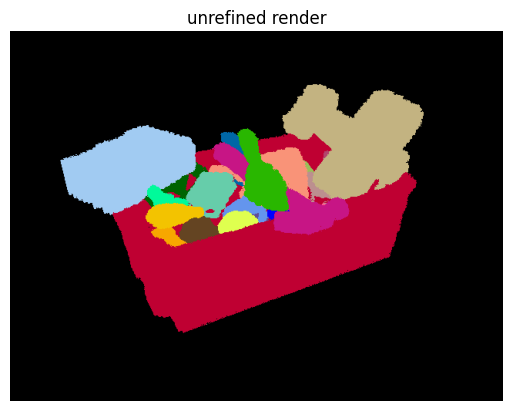

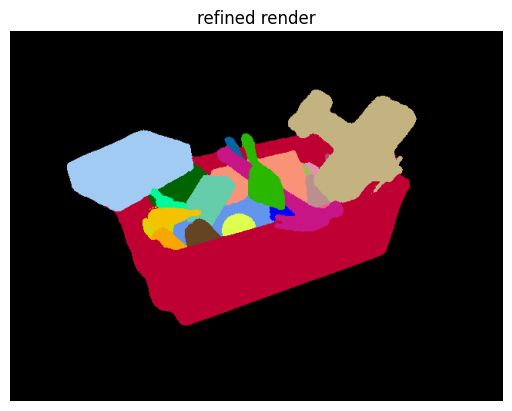

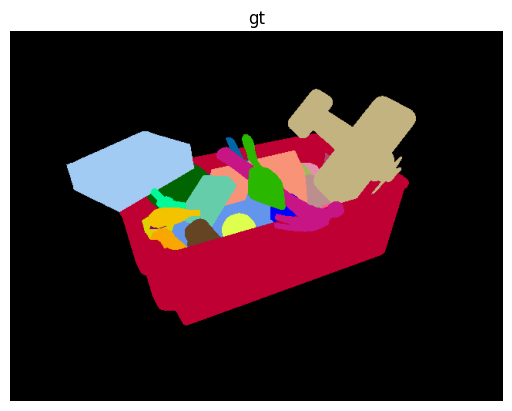

torch.Size([1, 1, 4, 4]) torch.Size([1, 1, 3, 3]) torch.Size([1, 1, 1, 480, 640])
cam 1
tensor(0., device='cuda:0', dtype=torch.float16) tensor(1., device='cuda:0', dtype=torch.float16)


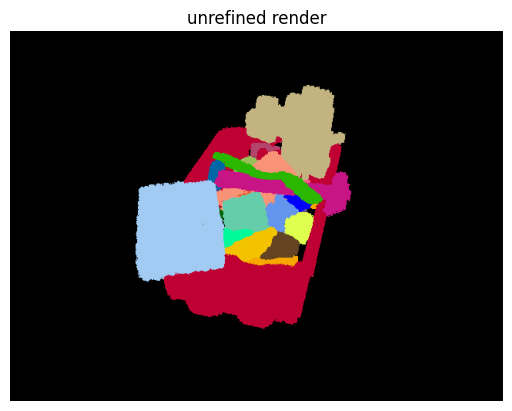

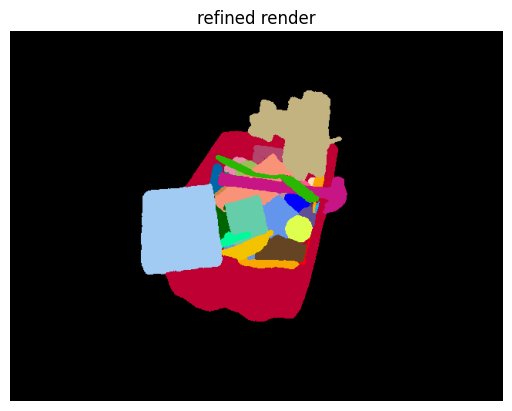

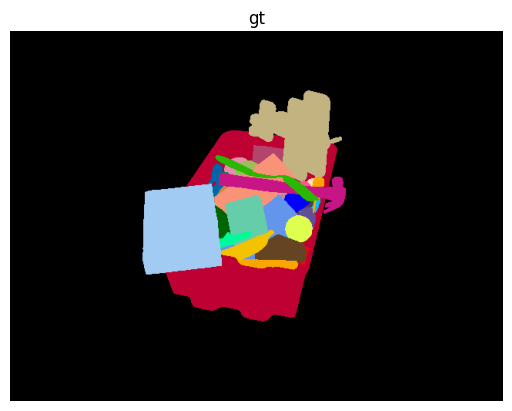

torch.Size([1, 1, 4, 4]) torch.Size([1, 1, 3, 3]) torch.Size([1, 1, 1, 480, 640])
cam 2
tensor(0., device='cuda:0', dtype=torch.float16) tensor(1., device='cuda:0', dtype=torch.float16)


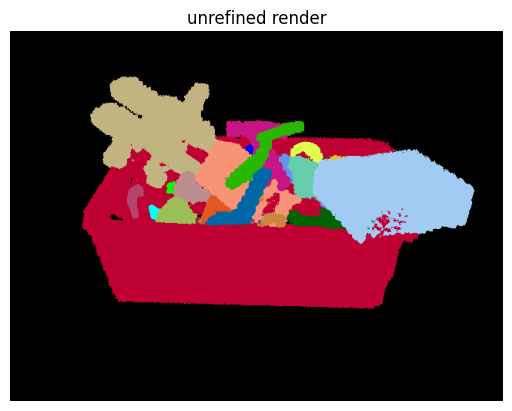

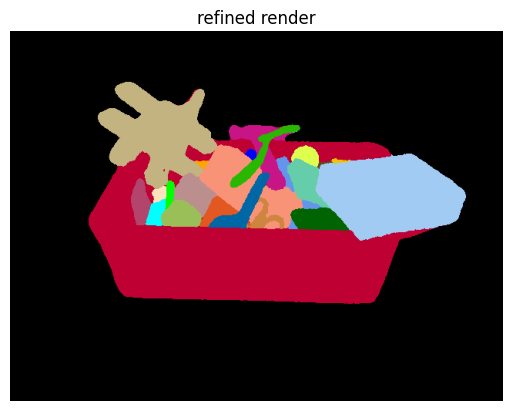

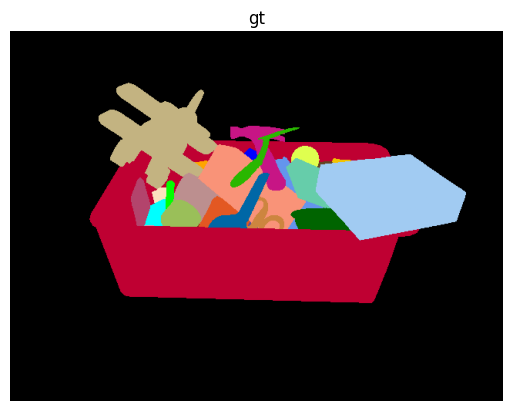

torch.Size([1, 1, 4, 4]) torch.Size([1, 1, 3, 3]) torch.Size([1, 1, 1, 480, 640])
cam 3
tensor(0., device='cuda:0', dtype=torch.float16) tensor(1., device='cuda:0', dtype=torch.float16)


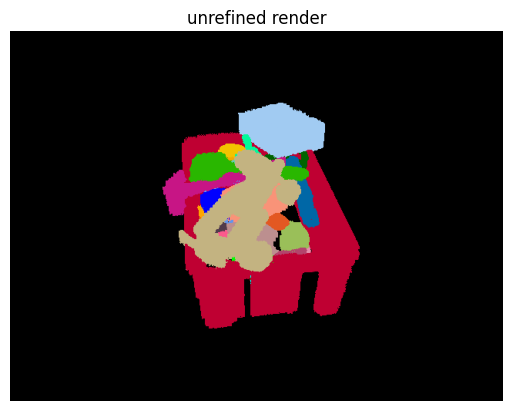

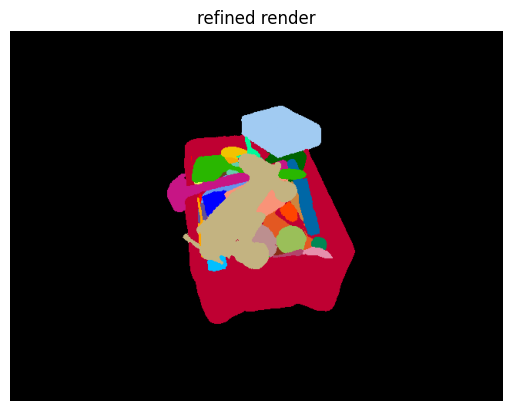

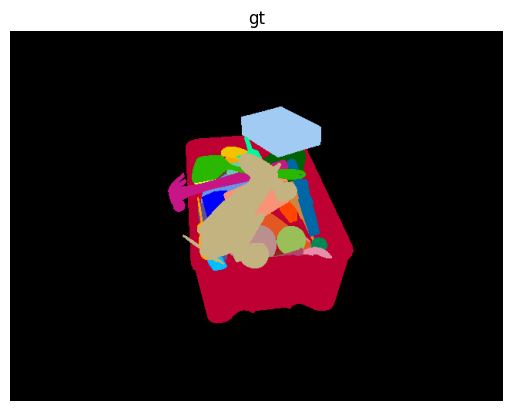

torch.Size([1, 1, 4, 4]) torch.Size([1, 1, 3, 3]) torch.Size([1, 1, 1, 480, 640])
cam 4
tensor(0., device='cuda:0', dtype=torch.float16) tensor(1., device='cuda:0', dtype=torch.float16)


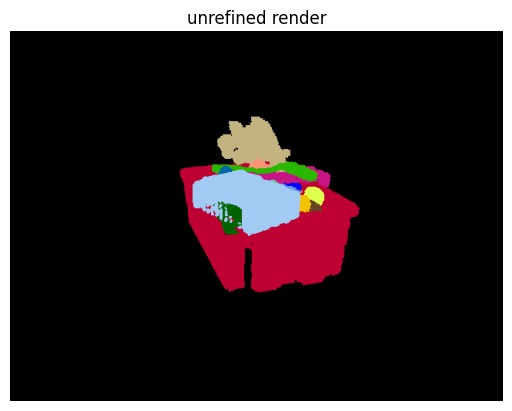

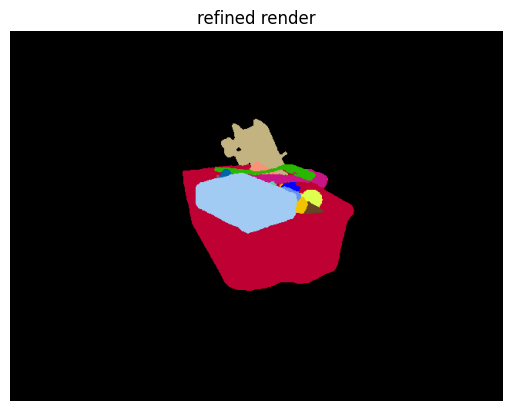

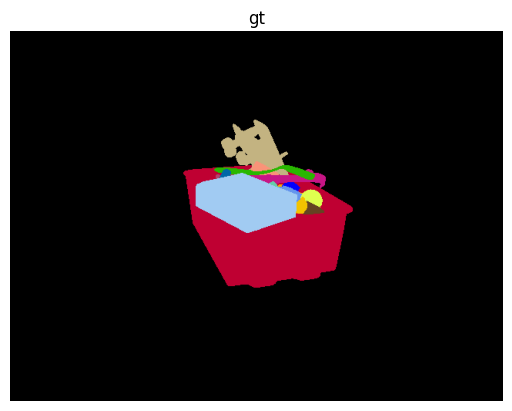

torch.Size([1, 1, 4, 4]) torch.Size([1, 1, 3, 3]) torch.Size([1, 1, 1, 480, 640])
cam 5
tensor(0., device='cuda:0', dtype=torch.float16) tensor(1., device='cuda:0', dtype=torch.float16)


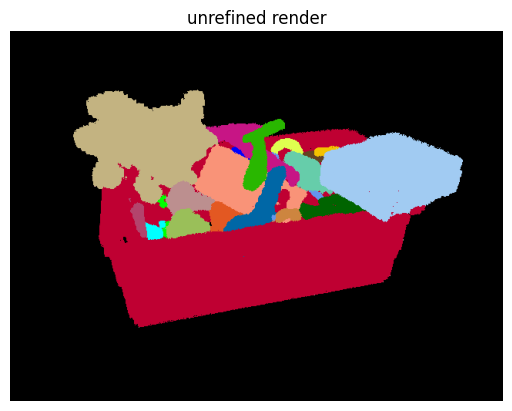

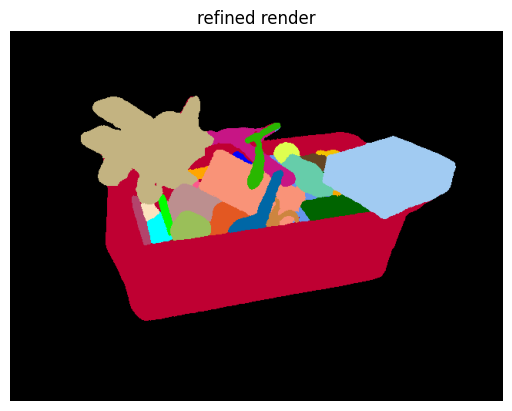

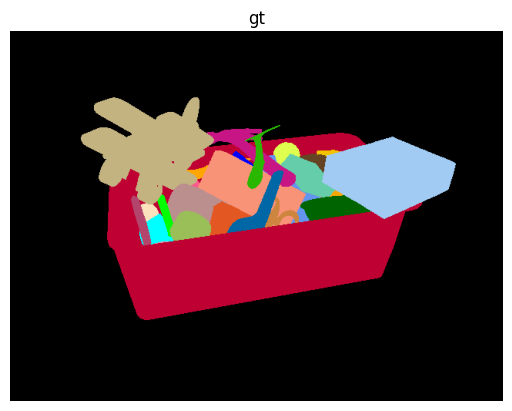

torch.Size([1, 1, 4, 4]) torch.Size([1, 1, 3, 3]) torch.Size([1, 1, 1, 480, 640])
cam 6
tensor(0., device='cuda:0', dtype=torch.float16) tensor(1., device='cuda:0', dtype=torch.float16)


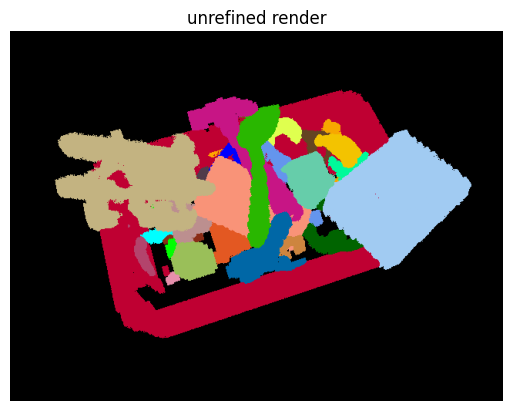

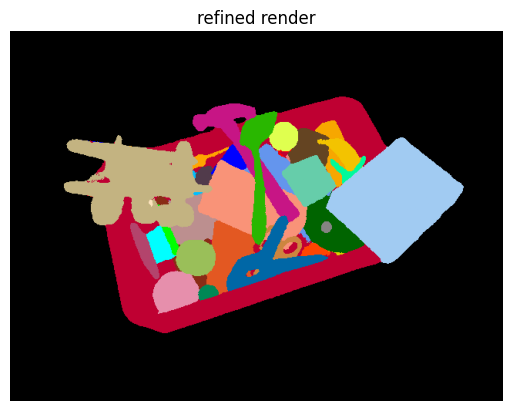

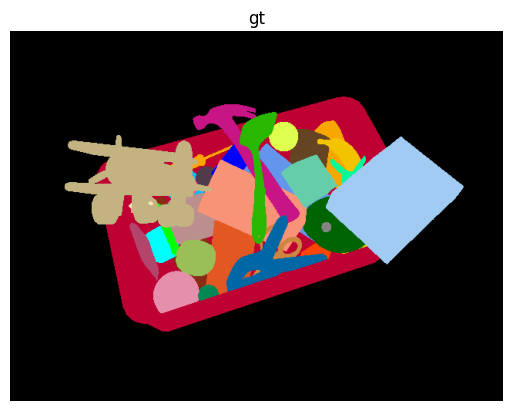

torch.Size([1, 1, 4, 4]) torch.Size([1, 1, 3, 3]) torch.Size([1, 1, 1, 480, 640])
cam 7
tensor(0., device='cuda:0', dtype=torch.float16) tensor(1., device='cuda:0', dtype=torch.float16)


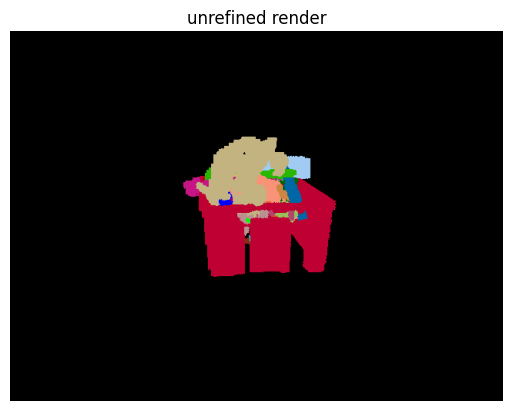

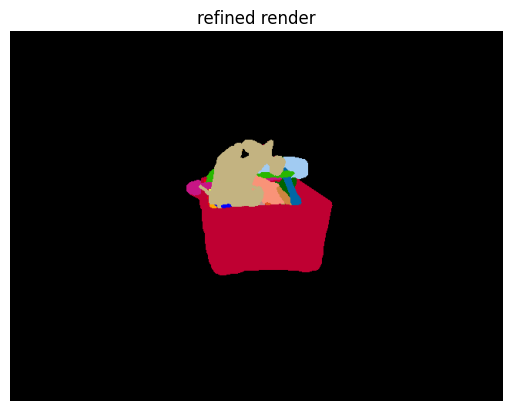

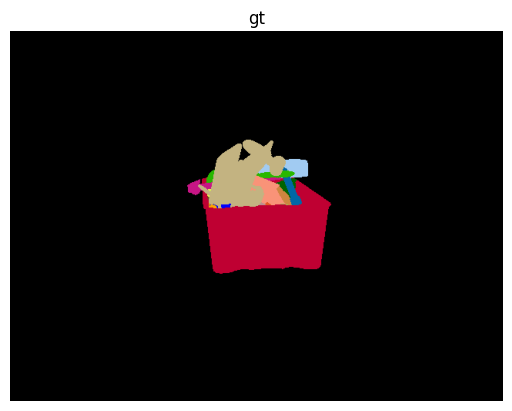

torch.Size([1, 1, 4, 4]) torch.Size([1, 1, 3, 3]) torch.Size([1, 1, 1, 480, 640])
cam 8
tensor(0., device='cuda:0', dtype=torch.float16) tensor(1., device='cuda:0', dtype=torch.float16)


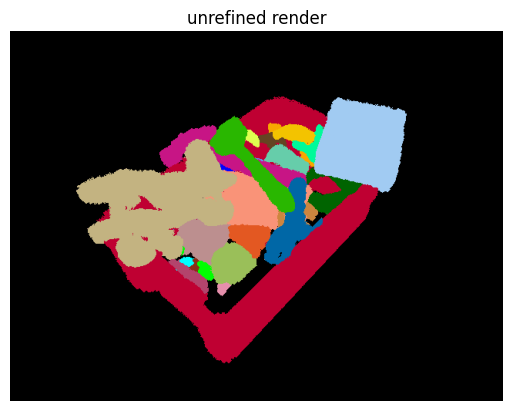

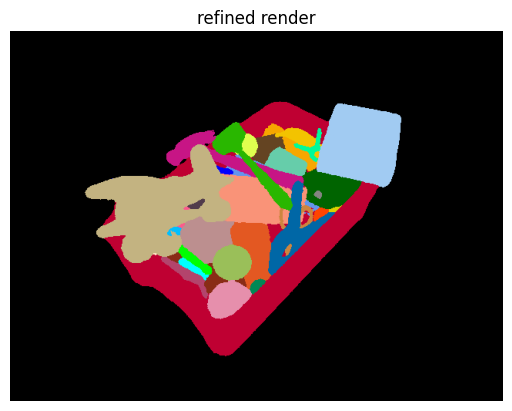

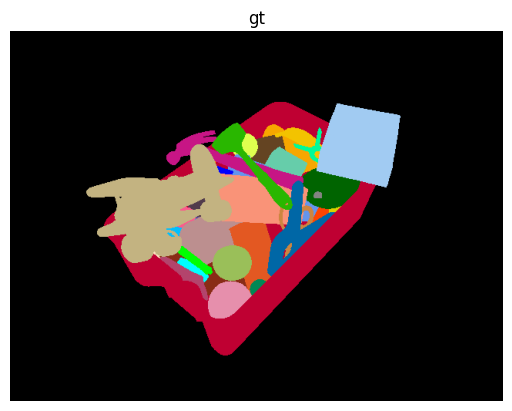

torch.Size([1, 1, 4, 4]) torch.Size([1, 1, 3, 3]) torch.Size([1, 1, 1, 480, 640])
cam 9
tensor(0., device='cuda:0', dtype=torch.float16) tensor(1., device='cuda:0', dtype=torch.float16)


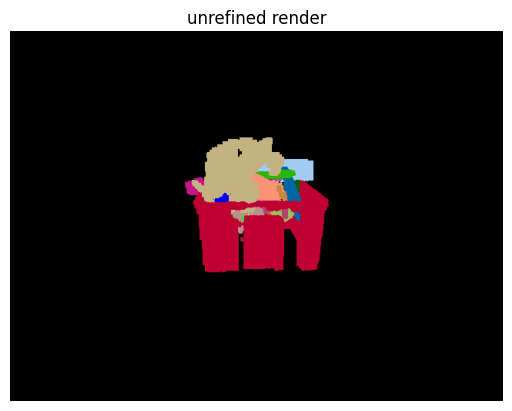

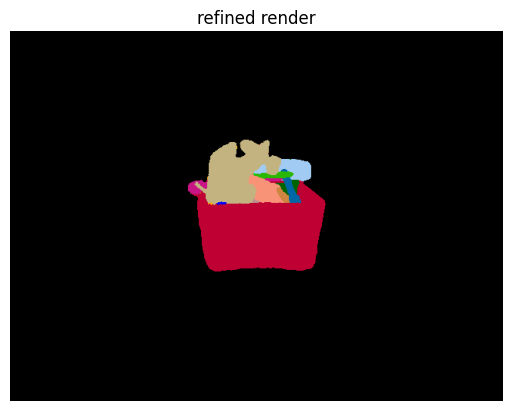

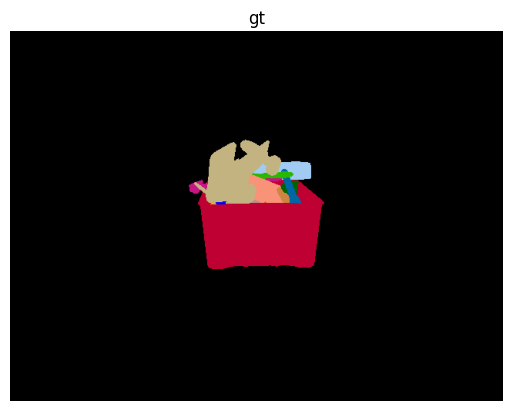

torch.Size([1, 1, 4, 4]) torch.Size([1, 1, 3, 3]) torch.Size([1, 1, 1, 480, 640])
cam 10
tensor(0., device='cuda:0', dtype=torch.float16) tensor(1., device='cuda:0', dtype=torch.float16)


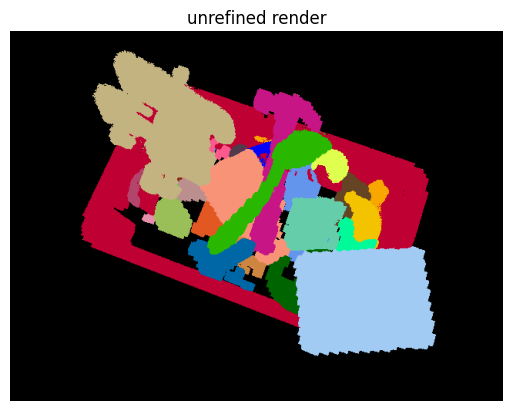

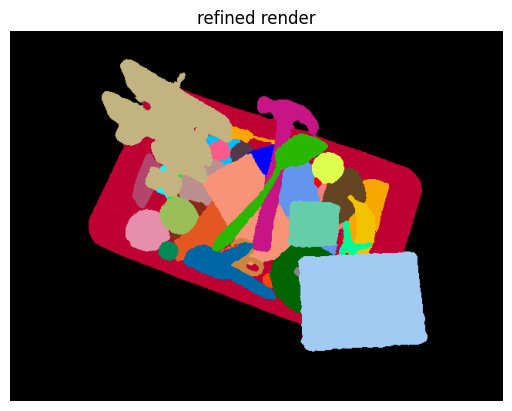

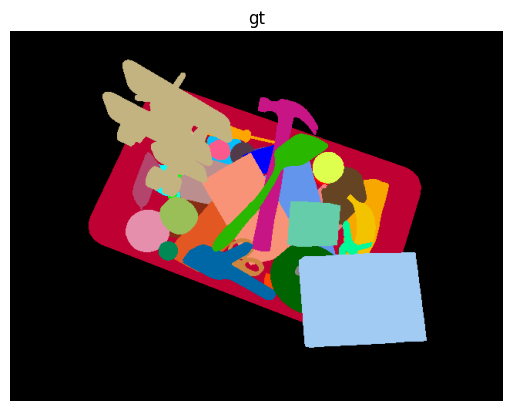

torch.Size([1, 1, 4, 4]) torch.Size([1, 1, 3, 3]) torch.Size([1, 1, 1, 480, 640])
cam 11
tensor(0., device='cuda:0', dtype=torch.float16) tensor(1., device='cuda:0', dtype=torch.float16)


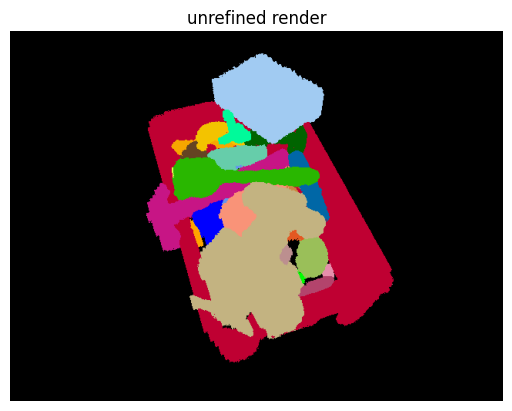

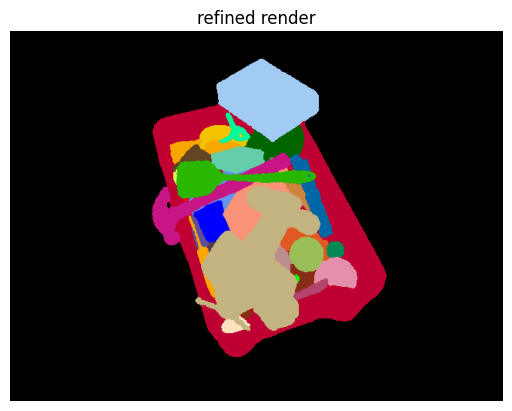

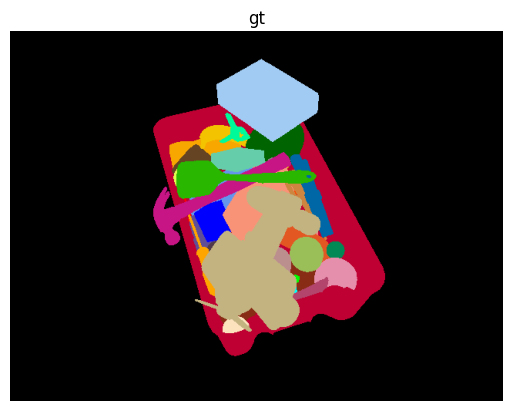

torch.Size([1, 1, 4, 4]) torch.Size([1, 1, 3, 3]) torch.Size([1, 1, 1, 480, 640])
cam 12
tensor(0., device='cuda:0', dtype=torch.float16) tensor(1., device='cuda:0', dtype=torch.float16)


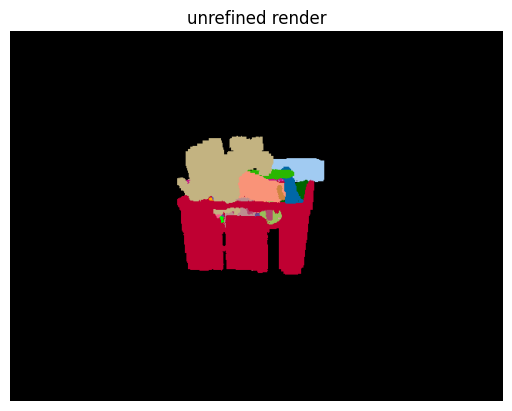

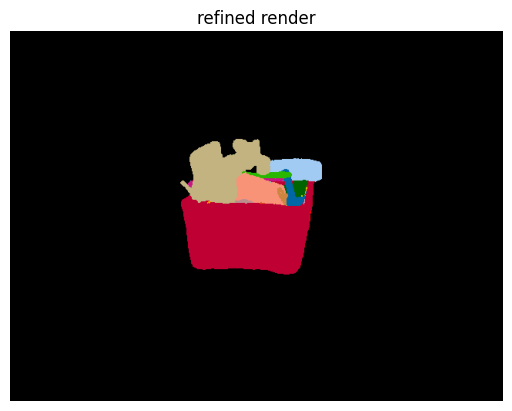

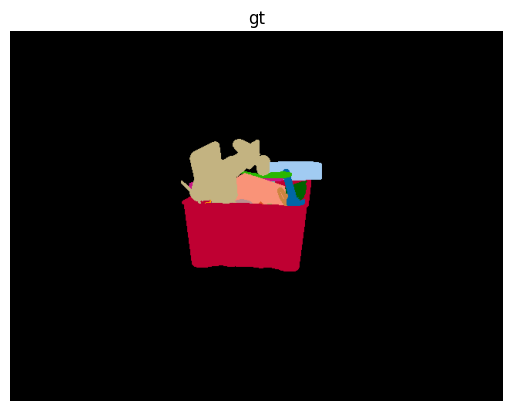

torch.Size([1, 1, 4, 4]) torch.Size([1, 1, 3, 3]) torch.Size([1, 1, 1, 480, 640])
cam 13
tensor(0., device='cuda:0', dtype=torch.float16) tensor(1., device='cuda:0', dtype=torch.float16)


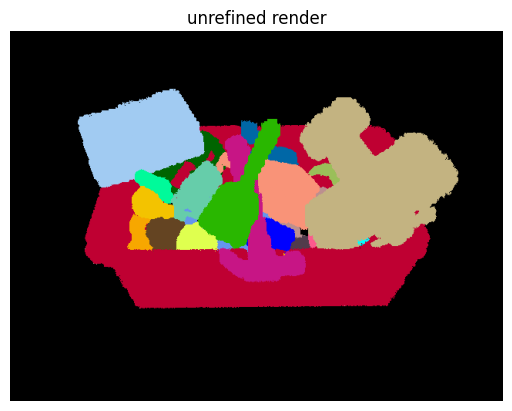

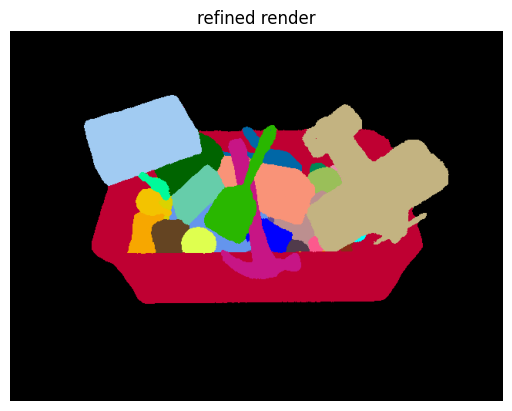

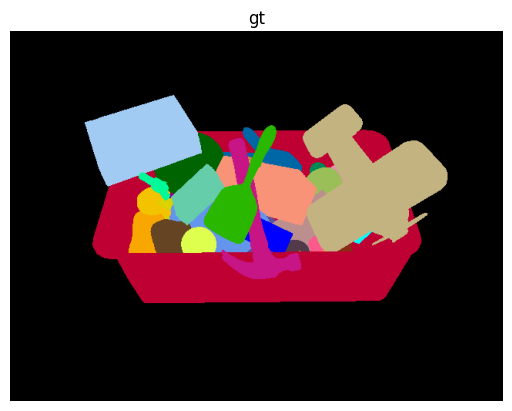

torch.Size([1, 1, 4, 4]) torch.Size([1, 1, 3, 3]) torch.Size([1, 1, 1, 480, 640])
cam 14
tensor(0., device='cuda:0', dtype=torch.float16) tensor(1., device='cuda:0', dtype=torch.float16)


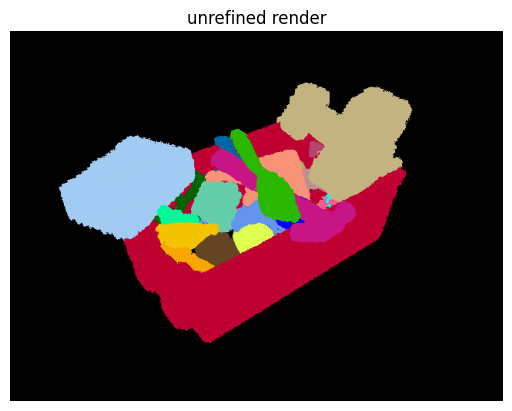

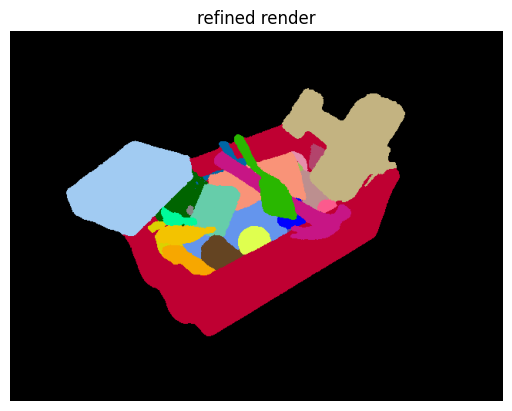

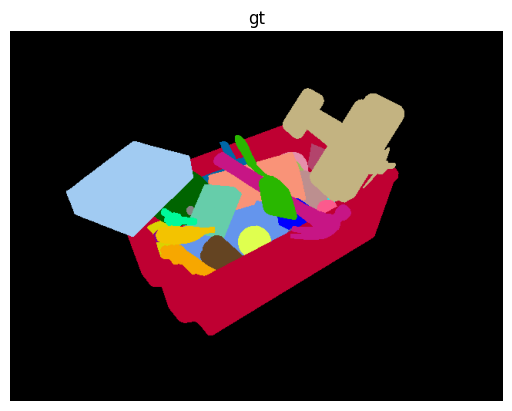

torch.Size([1, 1, 4, 4]) torch.Size([1, 1, 3, 3]) torch.Size([1, 1, 1, 480, 640])
cam 15
tensor(0., device='cuda:0', dtype=torch.float16) tensor(1., device='cuda:0', dtype=torch.float16)


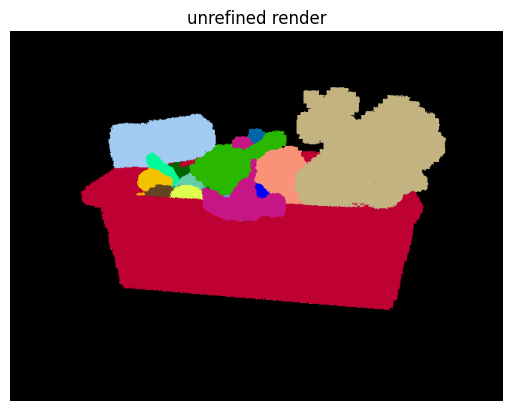

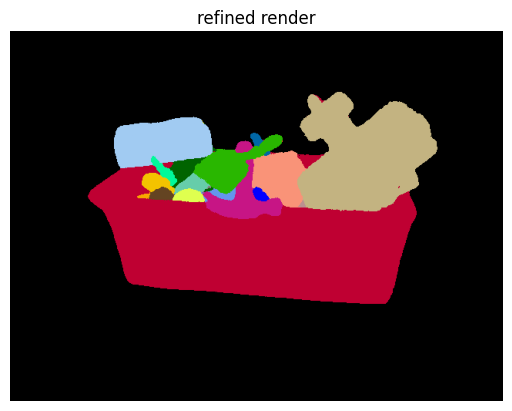

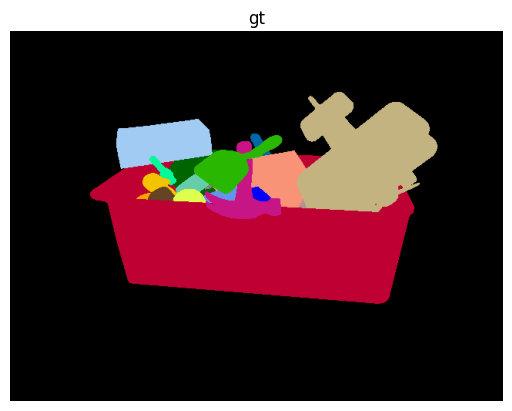

torch.Size([1, 1, 4, 4]) torch.Size([1, 1, 3, 3]) torch.Size([1, 1, 1, 480, 640])
cam 16
tensor(0., device='cuda:0', dtype=torch.float16) tensor(1., device='cuda:0', dtype=torch.float16)


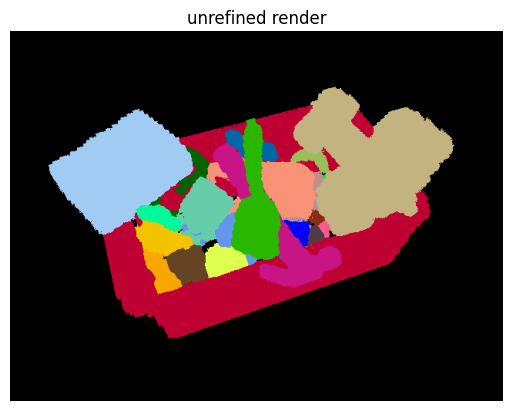

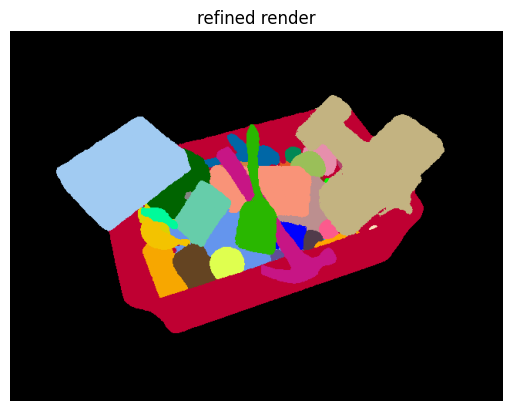

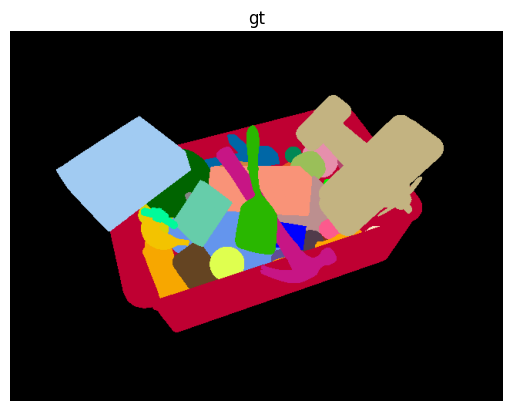

torch.Size([1, 1, 4, 4]) torch.Size([1, 1, 3, 3]) torch.Size([1, 1, 1, 480, 640])
cam 17
tensor(0., device='cuda:0', dtype=torch.float16) tensor(1., device='cuda:0', dtype=torch.float16)


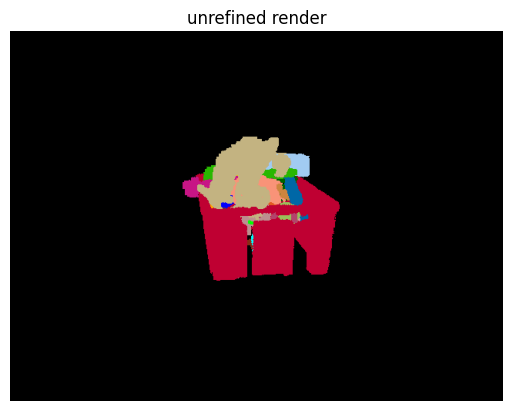

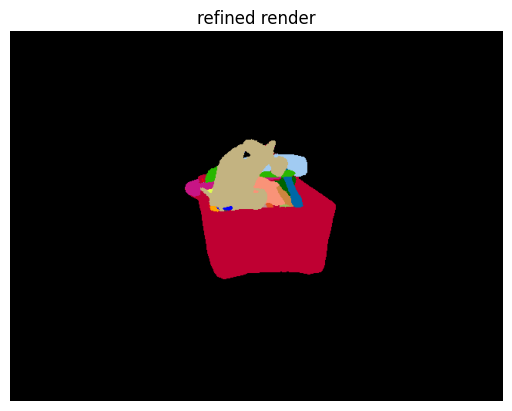

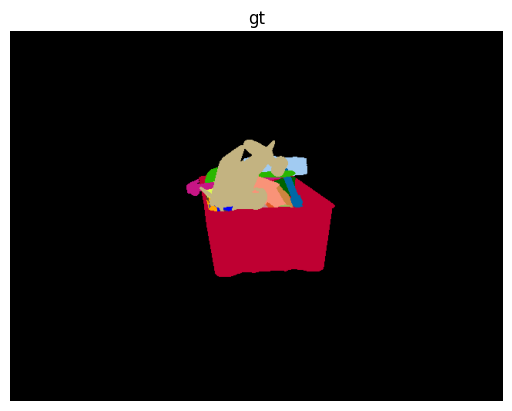

torch.Size([1, 1, 4, 4]) torch.Size([1, 1, 3, 3]) torch.Size([1, 1, 1, 480, 640])
cam 18
tensor(0., device='cuda:0', dtype=torch.float16) tensor(1., device='cuda:0', dtype=torch.float16)


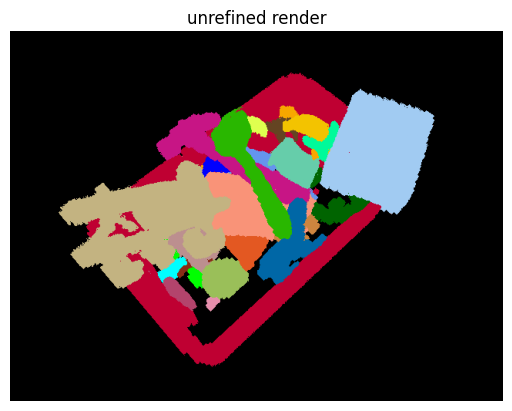

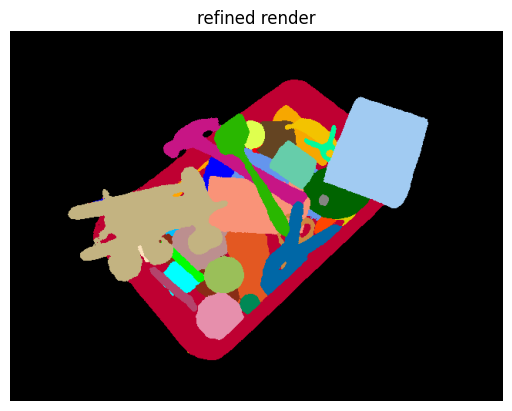

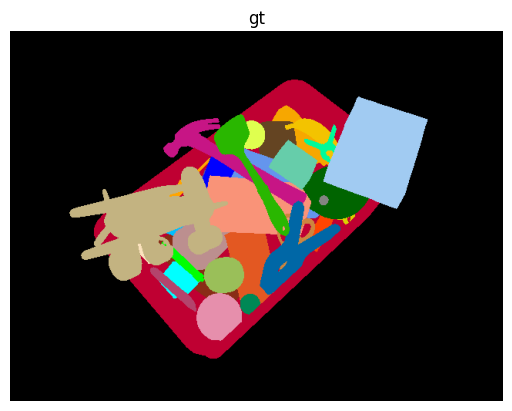

torch.Size([1, 1, 4, 4]) torch.Size([1, 1, 3, 3]) torch.Size([1, 1, 1, 480, 640])
cam 19
tensor(0., device='cuda:0', dtype=torch.float16) tensor(1., device='cuda:0', dtype=torch.float16)


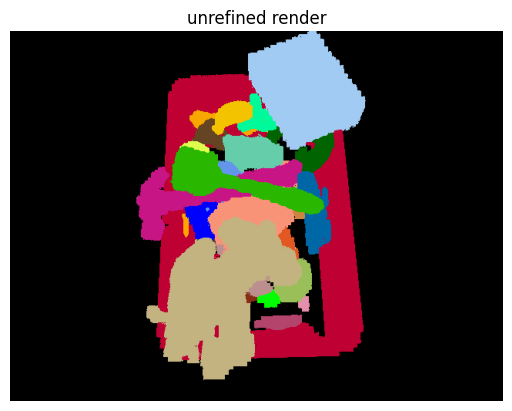

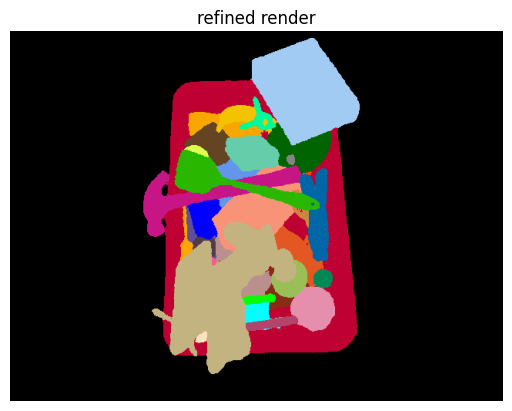

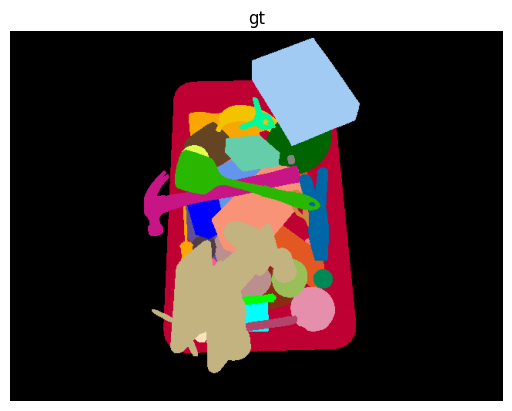

torch.Size([1, 1, 4, 4]) torch.Size([1, 1, 3, 3]) torch.Size([1, 1, 1, 480, 640])
cam 20
tensor(0., device='cuda:0', dtype=torch.float16) tensor(1., device='cuda:0', dtype=torch.float16)


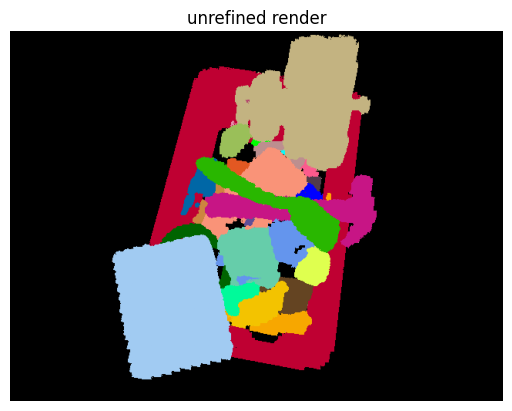

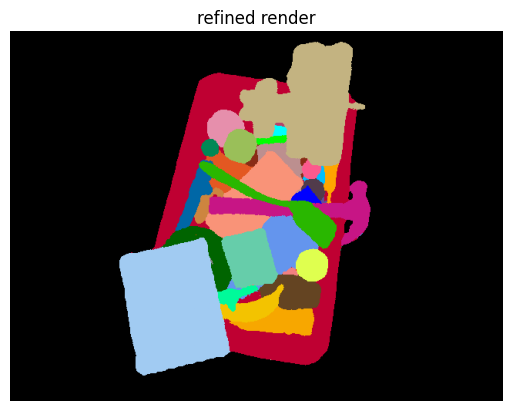

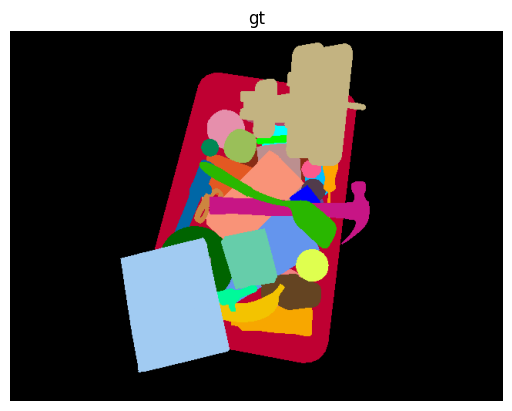

torch.Size([1, 1, 4, 4]) torch.Size([1, 1, 3, 3]) torch.Size([1, 1, 1, 480, 640])
cam 21
tensor(0., device='cuda:0', dtype=torch.float16) tensor(1., device='cuda:0', dtype=torch.float16)


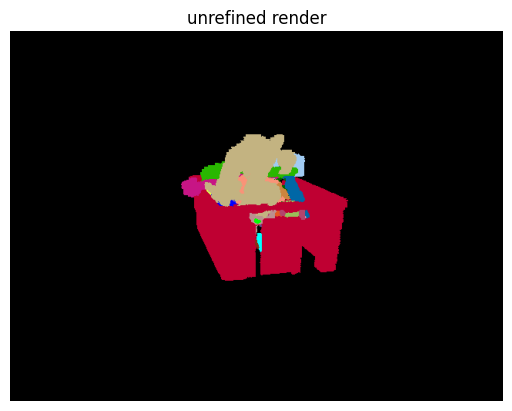

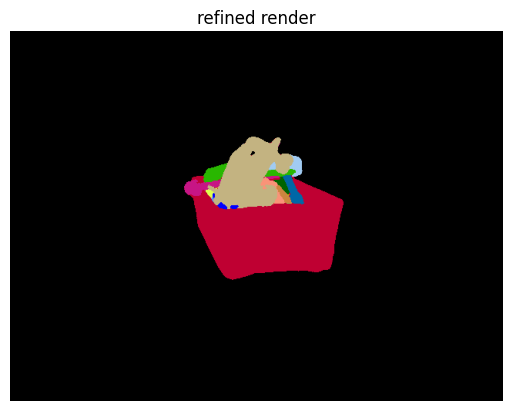

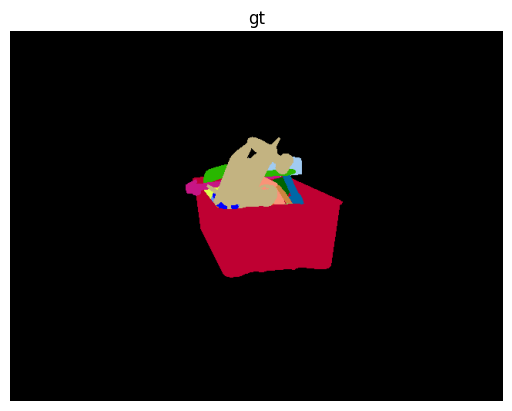

In [5]:
run_cell = True
if run_cell:
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    print('Using device:', device)
    dtype = torch.float32

    VERBOSE = True
    VIS = True
    RENDER = True
    N_STEPS = 1
    EPS = 6e-1

    #remap_cuda = remap.to(device)

    voxel_grid_config = np.load('voxel_grid_config.npy', allow_pickle=True).item()

    print('Channels:', voxel_grid_config['channels'])
    print('World size:', voxel_grid_config['world_size'])
    print('Voxel size:', voxel_grid_config['voxel_size'])
    if voxel_grid_config['use_pos_enc']:
        print('Positional encoding shape:', voxel_grid_config['pos_enc'].shape)
    print()

    # renderer setup
    N_RAYS = -1
    N_POINTS = 192


    #model = UNet3d(in_channels=1+voxel_grid_config['channels']+2, out_channels=1+voxel_grid_config['channels'], trilinear=False)
    #model = model.to(device)
    model_config = np.load('model_config.npy', allow_pickle=True).item()
    model = RefineModel(**dict(model_config))
    model = model.to(device)

    model.load_state_dict(torch.load('net_best_'+MODE+'.pt'))
    model.eval()

    #model = lambda x: x


    ##### train
    best_loss = 1e25
    test_dataloader.collate_fn.set_steps(N_STEPS, N_STEPS)
    for pcd, semseg, cam_pose, depth, cam_k, gt in test_dataloader:
        semseg, cam_pose, depth, cam_k = semseg.to(device), cam_pose.to(device), depth.to(device), cam_k.to(device)
        #semseg = remap_cuda[semseg]
        if VERBOSE:
            print('DATA LOADING')
            print('Minibatch output len/shapes\n', 'len(pcd), semseg.shape, cam_pose.shape, depth.shape, cam_k.shape')
            print(len(pcd), semseg.shape, cam_pose.shape, depth.shape, cam_k.shape)
            print()

        ##### FUSION STEP
        if VERBOSE:
            print('FUSION STEP')
        grid_batch = None
        grid_batch_refined = None
        for k, point_cloud_batch in enumerate(pcd):
            if VERBOSE:
                print('Point cloud batch shape:', point_cloud_batch.shape)
            # fuse voxels
            with torch.no_grad():
                grid_batch = batch_fuse_to_grid(point_cloud_batch.to(device), grid_batch,
                                                world_size=voxel_grid_config['world_size'],
                                                channels=voxel_grid_config['channels'],
                                                range_min=voxel_grid_config['range_min'],
                                                range_max=voxel_grid_config['range_max'],
                                                density_step=voxel_grid_config['density_factor']*voxel_grid_config['voxel_size'])
            if VERBOSE:
                print('Point cloud batch shape:', point_cloud_batch.shape)
            # fuse voxels
        with torch.no_grad():
            # switch to probabilities
            grid_batch_unrefined = torch.cat([grid_batch[:,:1], torch.exp(grid_batch[:,1:-1]), grid_batch[:,-1:]], dim=1)
            # concat positional encoding if necessary
            grid_batch_input = torch.cat([grid_batch_unrefined, 
                                          voxel_grid_config['pos_enc'].unsqueeze(0).expand(grid_batch_unrefined.shape[0],*voxel_grid_config['pos_enc'].shape).to(grid_batch_unrefined.device)],
                                          dim=1) if voxel_grid_config['use_pos_enc'] else grid_batch_unrefined
            # refine, switches to logits
            grid_batch_refined = model(grid_batch_input)
            # if necessary remove positional encoding again
            if voxel_grid_config['use_pos_enc']:
                grid_batch_refined = grid_batch_refined[:,:-voxel_grid_config['pos_enc'].shape[0]]
        if VERBOSE:
            print('Grid batch shape:', grid_batch.shape)
            print()
        # -> at this point grids is (BS, C, H, W, D)

        ##### REFINE STEP
        if RENDER:
            for cam_id in range(semseg.shape[1]):
                semseg_cam = semseg[:,cam_id:cam_id+1]
                cam_pose_cam = cam_pose[:,cam_id:cam_id+1]
                cam_k_cam = cam_k[:,cam_id:cam_id+1]
                ##### REFINE STEP
                with torch.no_grad():
                    print(cam_pose_cam.shape, cam_k_cam.shape, semseg_cam.shape)
                    render_unref, render_depth_unref, composite_mask_unref, gt_labels_unref, gt_depth_unref = render_grids(grid_batch.half(), voxel_grid_config, 
                                                                                cam_pose_cam, cam_k_cam, n_rays=N_RAYS,
                                                                                n_points=N_POINTS, semseg=semseg_cam)
                    render, render_depth, composite_mask, gt_labels, gt_depth = render_grids(grid_batch_refined.half(), voxel_grid_config, 
                                                                                cam_pose_cam, cam_k_cam, n_rays=N_RAYS,
                                                                                n_points=N_POINTS, semseg=semseg_cam)
                    if N_RAYS == -1 and VIS:
                        print(f'cam {cam_id}')
                        render_vis = render[0,0].T.reshape(-1,semseg.shape[-2],semseg.shape[-1])
                        render_vis = torch.argmax(render_vis, 0)
                        #print(render_vis.shape)
                        #print('Unique vals pred:', torch.unique(render_vis))
                        labels_vis = gt_labels[0,0].view(semseg.shape[-2],semseg.shape[-1])
                        #print('Unique vals gt:', torch.unique(labels_vis))
                        print(torch.min(composite_mask[0,0]), torch.max(composite_mask[0,0]))
                        tr = composite_mask[0,0].view(semseg.shape[-2],semseg.shape[-1])
                        background_render = torch.abs(tr - 1) <= EPS
                        #print(tr.min(), tr.max())
                        background_gt = labels_vis == -1
                        #print(background_render.shape, background_gt.shape)
                        render_vis = cmap_39[render_vis.long().cpu()]
                        render_vis[background_render] = torch.zeros(3).to(render_vis.device)
                        labels_vis = cmap_39[labels_vis.long().cpu()]
                        labels_vis[background_gt] = torch.zeros(3).to(labels_vis.device)

                        render_vis_unref = render_unref[0,0].T.reshape(-1,semseg.shape[-2],semseg.shape[-1])
                        render_vis_unref = torch.argmax(render_vis_unref, 0)
                        tr_unref = composite_mask_unref[0,0].view(semseg.shape[-2],semseg.shape[-1])
                        background_render_unref = torch.abs(tr_unref - 1) <= 0
                        render_vis_unref = cmap_39[render_vis_unref.long().cpu()]
                        render_vis_unref[background_render_unref] = torch.zeros(3).to(render_vis_unref.device)


                        plt.imshow(render_vis_unref.detach().cpu().numpy())
                        plt.axis('off')
                        plt.title('unrefined render')
                        plt.show()

                        #print(labels_vis.min(), labels_vis.max())
                        plt.imshow(render_vis.detach().cpu().numpy())
                        plt.axis('off')
                        plt.title('refined render')
                        plt.show()

                        plt.imshow(labels_vis.detach().cpu().numpy())
                        plt.axis('off')
                        plt.title('gt')
                        plt.show()
                        
                        plt.close('all')

In [6]:
# x and y axis probably still buggy
def get_orbit_world_cam(n_steps=100, r=1., h=0., axis='z', look_at=np.zeros(3)):
    phis = np.linspace(0, 2*np.pi, n_steps)[::-1]
    hs   = h * np.ones_like(phis)
    x = r * np.cos(phis)
    y = r * np.sin(phis)
    z = hs
    if axis == 'z':
        orbit = np.stack([x,y,z]).T
    elif axis == 'y':
        orbit = np.stack([x,z,y]).T
    elif axis == 'x':
        orbit = np.stack([z,x,y]).T
    orbit += look_at
    z_cam = (look_at - orbit)
    z_cam /= np.linalg.norm(z_cam, axis=-1, keepdims=True)
    
    x_cam = np.cross(z_cam, np.array([0., 0., -1.]))
    
    y_cam = np.cross(x_cam, z_cam)
    
    world_cam = np.zeros((n_steps, 4, 4))
    world_cam[:,:3,0] = -x_cam # maybe some bug here, image is mirrored
    world_cam[:,:3,1] = y_cam 
    world_cam[:,:3,2] = z_cam
    world_cam[:,:3,-1] = orbit
    
    world_cam[:,-1,-1] = 1
    
    world_cam_pt = torch.from_numpy(world_cam).float()
    #world_cam_pt[:,:3,:3] = world_cam_pt[:,:3,:3].permute(0,2,1)
    #world_cam_pt[:,:3,-1] = (world_cam_pt[:,:3,:3] @ world_cam_pt[:,:3,-1].unsqueeze(-1)).squeeze(-1)
    return world_cam_pt

In [7]:
@torch.no_grad()
def render_orbit(grids, grid_config, cam_k, scale=1., grid_idx=0, cam_idx=0, n_steps=100, r=1.5, h=0., axis='z', n_points=100, look_at=np.array([0,0,0.9]), max_chunksize=1000000):
    render_grid = grids[grid_idx:grid_idx+1]
    world_cam = get_orbit_world_cam(n_steps, r, h, axis, look_at).to(render_grid.device).unsqueeze(1)
    #for item in world_cam:
    #    print(item)
    cx = cam_k[grid_idx, cam_idx, 0, 2]
    cy = cam_k[grid_idx, cam_idx, 1, 2]
#    scale_matrix = torch.tensor([[scale, 0, 0.5*scale-0.5],
#                                 [0, scale, 0.5*scale-0.5],
#                                 [0, 0, 1]], device=render_grid.device)
    scale_matrix = torch.tensor([[scale, 0, scale],
                                 [0, scale, scale],
                                 [0, 0, 1]], device=render_grid.device)
    render_cam_k = scale_matrix[None,None] * cam_k[grid_idx:grid_idx+1, cam_idx:cam_idx+1]
    H, W = int(2*cy), int(2*cx)
    renders, renders_depth, trs = [], [], []
    for i in range(n_steps):
        r, rd, tr, _, _ = render_grids(render_grid, grid_config, world_cam[i:i+1], render_cam_k, n_points=n_points, H=H, W=W)
        renders.append(r.cpu())
        renders_depth.append(rd.cpu())
        trs.append(tr.cpu())
        del r, rd, tr
    return torch.stack(renders).squeeze().permute(0,2,1).view(n_steps,-1,H,W), torch.stack(renders_depth).squeeze().view(n_steps,H,W), torch.stack(trs).squeeze().view(n_steps,H,W)

In [8]:
renders, renders_depth, trs = render_orbit(grid_batch_refined.half(), voxel_grid_config, cam_k,  
                                           r=0.9, h=1., n_steps=300, n_points=N_POINTS, axis='z', 
                                           look_at=np.array([0,0,0.92]), max_chunksize=100000000)
#torch.save(render, 'renders.pt')
#torch.save(renders_depth, 'renders_depth.pt')
#torch.save(trs, 'trs.pt')
#print(torch.unique(renders))
#print(renders.shape, renders_depth.shape, trs.shape)
render_vis = cmap_39[renders.argmax(1).squeeze()]

background_render = torch.abs(trs - 1) <= EPS

render_vis[background_render] = torch.zeros(3).to(render_vis.device)

render_vis_np = (255*render_vis).byte().numpy()

clip = mpy.ImageSequenceClip([item for item in render_vis_np], fps=30)

clip.ipython_display()

Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


In [9]:
from matplotlib.colors import ListedColormap

#plt.hist(renders_depth.flatten().numpy())
#plt.show()

#### Colormap for depth ####
# https://gist.github.com/FedeMiorelli/640bbc66b2038a14802729e609abfe89
turbo_colormap_data = [[0.18995,0.07176,0.23217],[0.19483,0.08339,0.26149],[0.19956,0.09498,0.29024],[0.20415,0.10652,0.31844],[0.20860,0.11802,0.34607],[0.21291,0.12947,0.37314],[0.21708,0.14087,0.39964],[0.22111,0.15223,0.42558],[0.22500,0.16354,0.45096],[0.22875,0.17481,0.47578],[0.23236,0.18603,0.50004],[0.23582,0.19720,0.52373],[0.23915,0.20833,0.54686],[0.24234,0.21941,0.56942],[0.24539,0.23044,0.59142],[0.24830,0.24143,0.61286],[0.25107,0.25237,0.63374],[0.25369,0.26327,0.65406],[0.25618,0.27412,0.67381],[0.25853,0.28492,0.69300],[0.26074,0.29568,0.71162],[0.26280,0.30639,0.72968],[0.26473,0.31706,0.74718],[0.26652,0.32768,0.76412],[0.26816,0.33825,0.78050],[0.26967,0.34878,0.79631],[0.27103,0.35926,0.81156],[0.27226,0.36970,0.82624],[0.27334,0.38008,0.84037],[0.27429,0.39043,0.85393],[0.27509,0.40072,0.86692],[0.27576,0.41097,0.87936],[0.27628,0.42118,0.89123],[0.27667,0.43134,0.90254],[0.27691,0.44145,0.91328],[0.27701,0.45152,0.92347],[0.27698,0.46153,0.93309],[0.27680,0.47151,0.94214],[0.27648,0.48144,0.95064],[0.27603,0.49132,0.95857],[0.27543,0.50115,0.96594],[0.27469,0.51094,0.97275],[0.27381,0.52069,0.97899],[0.27273,0.53040,0.98461],[0.27106,0.54015,0.98930],[0.26878,0.54995,0.99303],[0.26592,0.55979,0.99583],[0.26252,0.56967,0.99773],[0.25862,0.57958,0.99876],[0.25425,0.58950,0.99896],[0.24946,0.59943,0.99835],[0.24427,0.60937,0.99697],[0.23874,0.61931,0.99485],[0.23288,0.62923,0.99202],[0.22676,0.63913,0.98851],[0.22039,0.64901,0.98436],[0.21382,0.65886,0.97959],[0.20708,0.66866,0.97423],[0.20021,0.67842,0.96833],[0.19326,0.68812,0.96190],[0.18625,0.69775,0.95498],[0.17923,0.70732,0.94761],[0.17223,0.71680,0.93981],[0.16529,0.72620,0.93161],[0.15844,0.73551,0.92305],[0.15173,0.74472,0.91416],[0.14519,0.75381,0.90496],[0.13886,0.76279,0.89550],[0.13278,0.77165,0.88580],[0.12698,0.78037,0.87590],[0.12151,0.78896,0.86581],[0.11639,0.79740,0.85559],[0.11167,0.80569,0.84525],[0.10738,0.81381,0.83484],[0.10357,0.82177,0.82437],[0.10026,0.82955,0.81389],[0.09750,0.83714,0.80342],[0.09532,0.84455,0.79299],[0.09377,0.85175,0.78264],[0.09287,0.85875,0.77240],[0.09267,0.86554,0.76230],[0.09320,0.87211,0.75237],[0.09451,0.87844,0.74265],[0.09662,0.88454,0.73316],[0.09958,0.89040,0.72393],[0.10342,0.89600,0.71500],[0.10815,0.90142,0.70599],[0.11374,0.90673,0.69651],[0.12014,0.91193,0.68660],[0.12733,0.91701,0.67627],[0.13526,0.92197,0.66556],[0.14391,0.92680,0.65448],[0.15323,0.93151,0.64308],[0.16319,0.93609,0.63137],[0.17377,0.94053,0.61938],[0.18491,0.94484,0.60713],[0.19659,0.94901,0.59466],[0.20877,0.95304,0.58199],[0.22142,0.95692,0.56914],[0.23449,0.96065,0.55614],[0.24797,0.96423,0.54303],[0.26180,0.96765,0.52981],[0.27597,0.97092,0.51653],[0.29042,0.97403,0.50321],[0.30513,0.97697,0.48987],[0.32006,0.97974,0.47654],[0.33517,0.98234,0.46325],[0.35043,0.98477,0.45002],[0.36581,0.98702,0.43688],[0.38127,0.98909,0.42386],[0.39678,0.99098,0.41098],[0.41229,0.99268,0.39826],[0.42778,0.99419,0.38575],[0.44321,0.99551,0.37345],[0.45854,0.99663,0.36140],[0.47375,0.99755,0.34963],[0.48879,0.99828,0.33816],[0.50362,0.99879,0.32701],[0.51822,0.99910,0.31622],[0.53255,0.99919,0.30581],[0.54658,0.99907,0.29581],[0.56026,0.99873,0.28623],[0.57357,0.99817,0.27712],[0.58646,0.99739,0.26849],[0.59891,0.99638,0.26038],[0.61088,0.99514,0.25280],[0.62233,0.99366,0.24579],[0.63323,0.99195,0.23937],[0.64362,0.98999,0.23356],[0.65394,0.98775,0.22835],[0.66428,0.98524,0.22370],[0.67462,0.98246,0.21960],[0.68494,0.97941,0.21602],[0.69525,0.97610,0.21294],[0.70553,0.97255,0.21032],[0.71577,0.96875,0.20815],[0.72596,0.96470,0.20640],[0.73610,0.96043,0.20504],[0.74617,0.95593,0.20406],[0.75617,0.95121,0.20343],[0.76608,0.94627,0.20311],[0.77591,0.94113,0.20310],[0.78563,0.93579,0.20336],[0.79524,0.93025,0.20386],[0.80473,0.92452,0.20459],[0.81410,0.91861,0.20552],[0.82333,0.91253,0.20663],[0.83241,0.90627,0.20788],[0.84133,0.89986,0.20926],[0.85010,0.89328,0.21074],[0.85868,0.88655,0.21230],[0.86709,0.87968,0.21391],[0.87530,0.87267,0.21555],[0.88331,0.86553,0.21719],[0.89112,0.85826,0.21880],[0.89870,0.85087,0.22038],[0.90605,0.84337,0.22188],[0.91317,0.83576,0.22328],[0.92004,0.82806,0.22456],[0.92666,0.82025,0.22570],[0.93301,0.81236,0.22667],[0.93909,0.80439,0.22744],[0.94489,0.79634,0.22800],[0.95039,0.78823,0.22831],[0.95560,0.78005,0.22836],[0.96049,0.77181,0.22811],[0.96507,0.76352,0.22754],[0.96931,0.75519,0.22663],[0.97323,0.74682,0.22536],[0.97679,0.73842,0.22369],[0.98000,0.73000,0.22161],[0.98289,0.72140,0.21918],[0.98549,0.71250,0.21650],[0.98781,0.70330,0.21358],[0.98986,0.69382,0.21043],[0.99163,0.68408,0.20706],[0.99314,0.67408,0.20348],[0.99438,0.66386,0.19971],[0.99535,0.65341,0.19577],[0.99607,0.64277,0.19165],[0.99654,0.63193,0.18738],[0.99675,0.62093,0.18297],[0.99672,0.60977,0.17842],[0.99644,0.59846,0.17376],[0.99593,0.58703,0.16899],[0.99517,0.57549,0.16412],[0.99419,0.56386,0.15918],[0.99297,0.55214,0.15417],[0.99153,0.54036,0.14910],[0.98987,0.52854,0.14398],[0.98799,0.51667,0.13883],[0.98590,0.50479,0.13367],[0.98360,0.49291,0.12849],[0.98108,0.48104,0.12332],[0.97837,0.46920,0.11817],[0.97545,0.45740,0.11305],[0.97234,0.44565,0.10797],[0.96904,0.43399,0.10294],[0.96555,0.42241,0.09798],[0.96187,0.41093,0.09310],[0.95801,0.39958,0.08831],[0.95398,0.38836,0.08362],[0.94977,0.37729,0.07905],[0.94538,0.36638,0.07461],[0.94084,0.35566,0.07031],[0.93612,0.34513,0.06616],[0.93125,0.33482,0.06218],[0.92623,0.32473,0.05837],[0.92105,0.31489,0.05475],[0.91572,0.30530,0.05134],[0.91024,0.29599,0.04814],[0.90463,0.28696,0.04516],[0.89888,0.27824,0.04243],[0.89298,0.26981,0.03993],[0.88691,0.26152,0.03753],[0.88066,0.25334,0.03521],[0.87422,0.24526,0.03297],[0.86760,0.23730,0.03082],[0.86079,0.22945,0.02875],[0.85380,0.22170,0.02677],[0.84662,0.21407,0.02487],[0.83926,0.20654,0.02305],[0.83172,0.19912,0.02131],[0.82399,0.19182,0.01966],[0.81608,0.18462,0.01809],[0.80799,0.17753,0.01660],[0.79971,0.17055,0.01520],[0.79125,0.16368,0.01387],[0.78260,0.15693,0.01264],[0.77377,0.15028,0.01148],[0.76476,0.14374,0.01041],[0.75556,0.13731,0.00942],[0.74617,0.13098,0.00851],[0.73661,0.12477,0.00769],[0.72686,0.11867,0.00695],[0.71692,0.11268,0.00629],[0.70680,0.10680,0.00571],[0.69650,0.10102,0.00522],[0.68602,0.09536,0.00481],[0.67535,0.08980,0.00449],[0.66449,0.08436,0.00424],[0.65345,0.07902,0.00408],[0.64223,0.07380,0.00401],[0.63082,0.06868,0.00401],[0.61923,0.06367,0.00410],[0.60746,0.05878,0.00427],[0.59550,0.05399,0.00453],[0.58336,0.04931,0.00486],[0.57103,0.04474,0.00529],[0.55852,0.04028,0.00579],[0.54583,0.03593,0.00638],[0.53295,0.03169,0.00705],[0.51989,0.02756,0.00780],[0.50664,0.02354,0.00863],[0.49321,0.01963,0.00955],[0.47960,0.01583,0.01055]]
cmap_depth = ListedColormap(turbo_colormap_data)

depth_min, depth_max = 0.95, 1.75

print(renders_depth.shape)
print(renders_depth.min(), renders_depth.max())
renders_depth_norm = renders_depth.float().numpy()
renders_depth_norm -= depth_min
renders_depth_norm /= (depth_max - depth_min)
print('Depth norm before mask:', renders_depth_norm.min(), renders_depth_norm.max())
min_mask, max_mask = renders_depth < depth_min, renders_depth > depth_max
renders_depth_norm[min_mask] = 0.
renders_depth_norm[max_mask] = 1.
renders_depth_norm[background_render] = 1.
renders_depth_norm[background_render][0] = 0.
#renders_depth_norm = torch.clamp(renders_depth_norm.float(), 0, 1)
#renders_depth_norm = F.normalize(renders_depth.float())
print('Depth norm after mask:', renders_depth_norm.min(), renders_depth_norm.max())
depth_rgb = cmap_depth(renders_depth_norm)[...,:3]
depth_rgb = np.uint8(depth_rgb * 255)
depth_rgb[background_render] = np.zeros(3)
depth_rgb[min_mask] = np.zeros(3)
depth_rgb[max_mask] = np.zeros(3)
print(depth_rgb.shape)
clip = mpy.ImageSequenceClip([item for item in depth_rgb], fps=30)
clip.ipython_display()

torch.Size([300, 480, 640])
tensor(0., dtype=torch.float16) tensor(2., dtype=torch.float16)
Depth norm before mask: -1.1875 1.3124999
Depth norm after mask: 0.0 1.0
(300, 480, 640, 3)
Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


In [10]:
renders, renders_depth, trs = render_orbit(grid_batch_unrefined.half(), voxel_grid_config, cam_k,  
                                           r=0.9, h=1., n_steps=300, n_points=N_POINTS, axis='z', 
                                           look_at=np.array([0,0,0.92]), max_chunksize=100000000)
#torch.save(render, 'renders.pt')
#torch.save(renders_depth, 'renders_depth.pt')
#torch.save(trs, 'trs.pt')
#print(torch.unique(renders))
#print(renders.shape, renders_depth.shape, trs.shape)
render_vis = cmap_39[renders.argmax(1).squeeze()]

background_render = torch.abs(trs - 1) <= 0

render_vis[background_render] = torch.zeros(3).to(render_vis.device)

render_vis_np = (255*render_vis).byte().numpy()

clip = mpy.ImageSequenceClip([item for item in render_vis_np], fps=30)

clip.ipython_display()

Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


In [11]:
#plt.hist(renders_depth.flatten().numpy())
#plt.show()

#### Colormap for depth ####
# https://gist.github.com/FedeMiorelli/640bbc66b2038a14802729e609abfe89
turbo_colormap_data = [[0.18995,0.07176,0.23217],[0.19483,0.08339,0.26149],[0.19956,0.09498,0.29024],[0.20415,0.10652,0.31844],[0.20860,0.11802,0.34607],[0.21291,0.12947,0.37314],[0.21708,0.14087,0.39964],[0.22111,0.15223,0.42558],[0.22500,0.16354,0.45096],[0.22875,0.17481,0.47578],[0.23236,0.18603,0.50004],[0.23582,0.19720,0.52373],[0.23915,0.20833,0.54686],[0.24234,0.21941,0.56942],[0.24539,0.23044,0.59142],[0.24830,0.24143,0.61286],[0.25107,0.25237,0.63374],[0.25369,0.26327,0.65406],[0.25618,0.27412,0.67381],[0.25853,0.28492,0.69300],[0.26074,0.29568,0.71162],[0.26280,0.30639,0.72968],[0.26473,0.31706,0.74718],[0.26652,0.32768,0.76412],[0.26816,0.33825,0.78050],[0.26967,0.34878,0.79631],[0.27103,0.35926,0.81156],[0.27226,0.36970,0.82624],[0.27334,0.38008,0.84037],[0.27429,0.39043,0.85393],[0.27509,0.40072,0.86692],[0.27576,0.41097,0.87936],[0.27628,0.42118,0.89123],[0.27667,0.43134,0.90254],[0.27691,0.44145,0.91328],[0.27701,0.45152,0.92347],[0.27698,0.46153,0.93309],[0.27680,0.47151,0.94214],[0.27648,0.48144,0.95064],[0.27603,0.49132,0.95857],[0.27543,0.50115,0.96594],[0.27469,0.51094,0.97275],[0.27381,0.52069,0.97899],[0.27273,0.53040,0.98461],[0.27106,0.54015,0.98930],[0.26878,0.54995,0.99303],[0.26592,0.55979,0.99583],[0.26252,0.56967,0.99773],[0.25862,0.57958,0.99876],[0.25425,0.58950,0.99896],[0.24946,0.59943,0.99835],[0.24427,0.60937,0.99697],[0.23874,0.61931,0.99485],[0.23288,0.62923,0.99202],[0.22676,0.63913,0.98851],[0.22039,0.64901,0.98436],[0.21382,0.65886,0.97959],[0.20708,0.66866,0.97423],[0.20021,0.67842,0.96833],[0.19326,0.68812,0.96190],[0.18625,0.69775,0.95498],[0.17923,0.70732,0.94761],[0.17223,0.71680,0.93981],[0.16529,0.72620,0.93161],[0.15844,0.73551,0.92305],[0.15173,0.74472,0.91416],[0.14519,0.75381,0.90496],[0.13886,0.76279,0.89550],[0.13278,0.77165,0.88580],[0.12698,0.78037,0.87590],[0.12151,0.78896,0.86581],[0.11639,0.79740,0.85559],[0.11167,0.80569,0.84525],[0.10738,0.81381,0.83484],[0.10357,0.82177,0.82437],[0.10026,0.82955,0.81389],[0.09750,0.83714,0.80342],[0.09532,0.84455,0.79299],[0.09377,0.85175,0.78264],[0.09287,0.85875,0.77240],[0.09267,0.86554,0.76230],[0.09320,0.87211,0.75237],[0.09451,0.87844,0.74265],[0.09662,0.88454,0.73316],[0.09958,0.89040,0.72393],[0.10342,0.89600,0.71500],[0.10815,0.90142,0.70599],[0.11374,0.90673,0.69651],[0.12014,0.91193,0.68660],[0.12733,0.91701,0.67627],[0.13526,0.92197,0.66556],[0.14391,0.92680,0.65448],[0.15323,0.93151,0.64308],[0.16319,0.93609,0.63137],[0.17377,0.94053,0.61938],[0.18491,0.94484,0.60713],[0.19659,0.94901,0.59466],[0.20877,0.95304,0.58199],[0.22142,0.95692,0.56914],[0.23449,0.96065,0.55614],[0.24797,0.96423,0.54303],[0.26180,0.96765,0.52981],[0.27597,0.97092,0.51653],[0.29042,0.97403,0.50321],[0.30513,0.97697,0.48987],[0.32006,0.97974,0.47654],[0.33517,0.98234,0.46325],[0.35043,0.98477,0.45002],[0.36581,0.98702,0.43688],[0.38127,0.98909,0.42386],[0.39678,0.99098,0.41098],[0.41229,0.99268,0.39826],[0.42778,0.99419,0.38575],[0.44321,0.99551,0.37345],[0.45854,0.99663,0.36140],[0.47375,0.99755,0.34963],[0.48879,0.99828,0.33816],[0.50362,0.99879,0.32701],[0.51822,0.99910,0.31622],[0.53255,0.99919,0.30581],[0.54658,0.99907,0.29581],[0.56026,0.99873,0.28623],[0.57357,0.99817,0.27712],[0.58646,0.99739,0.26849],[0.59891,0.99638,0.26038],[0.61088,0.99514,0.25280],[0.62233,0.99366,0.24579],[0.63323,0.99195,0.23937],[0.64362,0.98999,0.23356],[0.65394,0.98775,0.22835],[0.66428,0.98524,0.22370],[0.67462,0.98246,0.21960],[0.68494,0.97941,0.21602],[0.69525,0.97610,0.21294],[0.70553,0.97255,0.21032],[0.71577,0.96875,0.20815],[0.72596,0.96470,0.20640],[0.73610,0.96043,0.20504],[0.74617,0.95593,0.20406],[0.75617,0.95121,0.20343],[0.76608,0.94627,0.20311],[0.77591,0.94113,0.20310],[0.78563,0.93579,0.20336],[0.79524,0.93025,0.20386],[0.80473,0.92452,0.20459],[0.81410,0.91861,0.20552],[0.82333,0.91253,0.20663],[0.83241,0.90627,0.20788],[0.84133,0.89986,0.20926],[0.85010,0.89328,0.21074],[0.85868,0.88655,0.21230],[0.86709,0.87968,0.21391],[0.87530,0.87267,0.21555],[0.88331,0.86553,0.21719],[0.89112,0.85826,0.21880],[0.89870,0.85087,0.22038],[0.90605,0.84337,0.22188],[0.91317,0.83576,0.22328],[0.92004,0.82806,0.22456],[0.92666,0.82025,0.22570],[0.93301,0.81236,0.22667],[0.93909,0.80439,0.22744],[0.94489,0.79634,0.22800],[0.95039,0.78823,0.22831],[0.95560,0.78005,0.22836],[0.96049,0.77181,0.22811],[0.96507,0.76352,0.22754],[0.96931,0.75519,0.22663],[0.97323,0.74682,0.22536],[0.97679,0.73842,0.22369],[0.98000,0.73000,0.22161],[0.98289,0.72140,0.21918],[0.98549,0.71250,0.21650],[0.98781,0.70330,0.21358],[0.98986,0.69382,0.21043],[0.99163,0.68408,0.20706],[0.99314,0.67408,0.20348],[0.99438,0.66386,0.19971],[0.99535,0.65341,0.19577],[0.99607,0.64277,0.19165],[0.99654,0.63193,0.18738],[0.99675,0.62093,0.18297],[0.99672,0.60977,0.17842],[0.99644,0.59846,0.17376],[0.99593,0.58703,0.16899],[0.99517,0.57549,0.16412],[0.99419,0.56386,0.15918],[0.99297,0.55214,0.15417],[0.99153,0.54036,0.14910],[0.98987,0.52854,0.14398],[0.98799,0.51667,0.13883],[0.98590,0.50479,0.13367],[0.98360,0.49291,0.12849],[0.98108,0.48104,0.12332],[0.97837,0.46920,0.11817],[0.97545,0.45740,0.11305],[0.97234,0.44565,0.10797],[0.96904,0.43399,0.10294],[0.96555,0.42241,0.09798],[0.96187,0.41093,0.09310],[0.95801,0.39958,0.08831],[0.95398,0.38836,0.08362],[0.94977,0.37729,0.07905],[0.94538,0.36638,0.07461],[0.94084,0.35566,0.07031],[0.93612,0.34513,0.06616],[0.93125,0.33482,0.06218],[0.92623,0.32473,0.05837],[0.92105,0.31489,0.05475],[0.91572,0.30530,0.05134],[0.91024,0.29599,0.04814],[0.90463,0.28696,0.04516],[0.89888,0.27824,0.04243],[0.89298,0.26981,0.03993],[0.88691,0.26152,0.03753],[0.88066,0.25334,0.03521],[0.87422,0.24526,0.03297],[0.86760,0.23730,0.03082],[0.86079,0.22945,0.02875],[0.85380,0.22170,0.02677],[0.84662,0.21407,0.02487],[0.83926,0.20654,0.02305],[0.83172,0.19912,0.02131],[0.82399,0.19182,0.01966],[0.81608,0.18462,0.01809],[0.80799,0.17753,0.01660],[0.79971,0.17055,0.01520],[0.79125,0.16368,0.01387],[0.78260,0.15693,0.01264],[0.77377,0.15028,0.01148],[0.76476,0.14374,0.01041],[0.75556,0.13731,0.00942],[0.74617,0.13098,0.00851],[0.73661,0.12477,0.00769],[0.72686,0.11867,0.00695],[0.71692,0.11268,0.00629],[0.70680,0.10680,0.00571],[0.69650,0.10102,0.00522],[0.68602,0.09536,0.00481],[0.67535,0.08980,0.00449],[0.66449,0.08436,0.00424],[0.65345,0.07902,0.00408],[0.64223,0.07380,0.00401],[0.63082,0.06868,0.00401],[0.61923,0.06367,0.00410],[0.60746,0.05878,0.00427],[0.59550,0.05399,0.00453],[0.58336,0.04931,0.00486],[0.57103,0.04474,0.00529],[0.55852,0.04028,0.00579],[0.54583,0.03593,0.00638],[0.53295,0.03169,0.00705],[0.51989,0.02756,0.00780],[0.50664,0.02354,0.00863],[0.49321,0.01963,0.00955],[0.47960,0.01583,0.01055]]
cmap_depth = ListedColormap(turbo_colormap_data)

print(renders_depth.shape)
print(renders_depth.min(), renders_depth.max())
renders_depth_norm = renders_depth.float().numpy()
renders_depth_norm -= depth_min
renders_depth_norm /= (depth_max - depth_min)
print(renders_depth_norm.min(), renders_depth_norm.max())
min_mask, max_mask = renders_depth < depth_min, renders_depth > depth_max
renders_depth_norm[min_mask] = 0.
renders_depth_norm[max_mask] = 1.
renders_depth_norm[background_render] = 1.
renders_depth_norm[background_render][0] = 0.
#renders_depth_norm = torch.clamp(renders_depth_norm.float(), 0, 1)
#renders_depth_norm = F.normalize(renders_depth.float())
print(renders_depth_norm.min(), renders_depth_norm.max())
depth_rgb = cmap_depth(renders_depth_norm)[...,:3]
depth_rgb = np.uint8(depth_rgb * 255)
depth_rgb[background_render] = np.zeros(3)
depth_rgb[min_mask] = np.zeros(3)
depth_rgb[max_mask] = np.zeros(3)
print(depth_rgb.shape)
clip = mpy.ImageSequenceClip([item for item in depth_rgb], fps=30)
clip.ipython_display()

torch.Size([300, 480, 640])
tensor(0., dtype=torch.float16) tensor(1.6445, dtype=torch.float16)
-1.1875 0.86816406
0.0 1.0
(300, 480, 640, 3)
Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4
